# Transform the data from the files and structure it in the correct pytorch way


In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import shutil


In [35]:
df_teeth_train = pd.read_csv('data/train/_annotations.csv')

df_teeth_valid = pd.read_csv('data/valid/_annotations.csv')

df_teeth_test = pd.read_csv('data/test/_annotations.csv')



In [3]:
df_teeth_train

,filename,width,height,class,xmin,ymin,xmax,ymax
0,0674_jpg.rf.e02a155a0c135687b9301ff9a20d220a.jpg,512,256,Implant,175,116,206,153
1,0674_jpg.rf.e02a155a0c135687b9301ff9a20d220a.jpg,512,256,Fillings,170,109,189,133
2,0674_jpg.rf.e02a155a0c135687b9301ff9a20d220a.jpg,512,256,Implant,221,124,257,178
3,0674_jpg.rf.e02a155a0c135687b9301ff9a20d220a.jpg,512,256,Implant,302,126,329,175
4,0674_jpg.rf.e02a155a0c135687b9301ff9a20d220a.jpg,512,256,Implant,335,114,360,154
...,...,...,...,...,...,...,...,...
8025,0754_jpg.rf.db2bd5c2b60f60c565a2fa1b49d81d91.jpg,512,256,Fillings,319,96,335,143
8026,0754_jpg.rf.db2bd5c2b60f60c565a2fa1b49d81d91.jpg,512,256,Fillings,284,149,303,203
8027,0754_jpg.rf.db2bd5c2b60f60c565a2fa1b49d81d91.jpg,512,256,Fillings,306,95,320,146
8028,0283_jpg.rf.df11105141de584571ccee130f419077.jpg,512,256,Impacted Tooth,372,133,399,162


In [35]:
def get_training_rows_per_category(df):
    """
    move the data from the train set, to a correct folder structure e.g.
    root/class/xxximg.jpg
    """
    implant_file_paths = df[df['class']=="Implant"]["filename"]
    impacted_file_paths = df[df['class']=="Impacted Tooth"]["filename"]
    fillings_file_paths = df[df['class']=="Fillings"]["filename"]


    class_path_dict ={
        "impacted": list(impacted_file_paths),
        "implant": list(implant_file_paths),
        "filling": list(fillings_file_paths)
    }

    return class_path_dict

def move_file_paths(class_path_dict, train_or_test="train"):
    """
    moves the file sin the class_path_dict to the correct class path in the destination
    """
    destination_classes = ["implant", "impacted", "filling"]
    for destination in destination_classes:
        print(f"dataset/{train_or_test}/{destination}")
        file_path = f"dataset/{train_or_test}/{destination}"
        if not os.path.exists(file_path):
            os.makedirs(file_path)
            print("hi")

    for class_cat, file_namelist in class_path_dict.items():
        for file_name in file_namelist:
            path_source = f"data/{train_or_test}/{file_name}"
            destination = f"dataset/{train_or_test}/{class_cat}/{file_name}"
            shutil.copyfile(src=path_source, dst=destination)



train_class_with_file_names_dict = get_training_rows_per_category(df_teeth_train)
move_file_paths(train_class_with_file_names_dict, "train")

test_class_with_file_names_dict = get_training_rows_per_category(df_teeth_test)
move_file_paths(test_class_with_file_names_dict, "test")

dataset/train/implant
hi
dataset/train/impacted
hi
dataset/train/filling
hi
dataset/test/implant
hi
dataset/test/impacted
hi
dataset/test/filling
hi


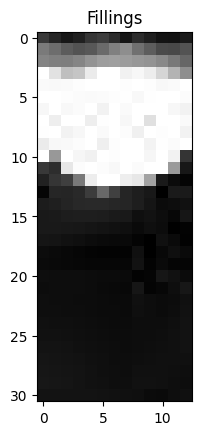

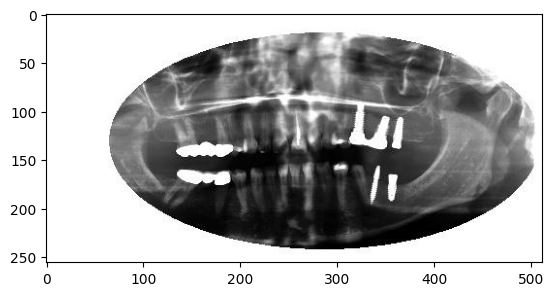

In [28]:
def get_training_rows_per_category(df):
    """
    move the data from the train set, to a correct folder structure e.g.
    root/class/xxximg.jpg
    """
    impacted_file_paths = df[df['class']=="Impacted Tooth"]



    return impacted_file_paths

def get_picture_area_from_row(row, data_folder="data", data_subfolder="train"):
    """
    Parameters
    ----------
    row : pandas row from the _annotations.csv file
        row from the dataframe
    data_folder : str, optional
        folder where the data is located

    data_subfolder : str, optional
        subfolder where the data is located

    Returns
    -------
    displays the part of the image that is in the row
    """
    file_path = f"{data_folder}/{data_subfolder}/{row['filename']}"
    img = plt.imread(file_path)
    x1, y1, x2, y2 = row['xmin'], row['ymin'], row['xmax'], row['ymax']
    plt.imshow(img[y1:y2, x1:x2])
    plt.title(row['class'])
    plt.show()

    plt.imshow(img)

get_picture_area_from_row(df_teeth_train.iloc[49])

In [36]:
impacted_df_train = get_training_rows_per_category(df_teeth_train)
impacted_df_valid = get_training_rows_per_category(df_teeth_valid)
impacted_df_test = get_training_rows_per_category(df_teeth_test)


In [45]:
def get_all_impacted_teeth_files(impacted_df_train,impacted_df_test,impacted_df_valid):
    """
    Parameters
    ----------
    impacted_df_train : pandas dataframe
        dataframe with the impacted teeth
    impacted_df_test : pandas dataframe
        dataframe with the impacted teeth
    impacted_df_valid : pandas dataframe
        dataframe with the impacted teeth
    data_folder : str, optional
        folder where the data is located

    data_subfolder : str, optional
        subfolder where the data is located

    Returns
    -------
    list of file paths
    """
    file_paths = []
    for index, row in impacted_df_train.iterrows():
        file_paths.append(row['filename'])
    for index, row in impacted_df_valid.iterrows():
        file_paths.append(row['filename'])
    for index, row in impacted_df_test.iterrows():
        file_paths.append(row['filename'])
    return file_paths
impacted_teeth_files = set(get_all_impacted_teeth_files(impacted_df_train,impacted_df_test,impacted_df_valid))

# Now we have the files that are impacted teeth, we can move the files to a new folder structure
The files are moved from the train, test and valid folders to the new folders it is checked if the file is already in the folder, if it is not it is copied to the folder. It is checked if a file has an impacted depending on the file name. If the file name is in the list of impacted teeth files, it is copied to the impacted folder, if not it is copied to the not_impacted folder.

In [58]:
i = 0
for train_test_valid in ["train", "test", "valid"]:
    folder_path = f"data/{train_test_valid}"
    if not os.path.isdir("data_impacted_not"):
        os.makedirs("data_impacted_not")
    if not os.path.isdir(f"data_impacted_not/{train_test_valid}"):
        os.makedirs(f"data_impacted_not/{train_test_valid}")
    if not os.path.isdir(f"data_impacted_not/{train_test_valid}/impacted"):
        os.makedirs(f"data_impacted_not/{train_test_valid}/impacted")
    if not os.path.isdir(f"data_impacted_not/{train_test_valid}/not_impacted"):
        os.makedirs(f"data_impacted_not/{train_test_valid}/not_impacted")

    for file in os.listdir(folder_path):
        if file in impacted_teeth_files and not os.path.isfile(f"data_impacted_not/{train_test_valid}/impacted/{file}"):
            shutil.copyfile(src=f"{folder_path}/{file}", dst=f"data_impacted_not/{train_test_valid}/impacted/{file}")
        elif file.endswith(".jpg") and file not in impacted_teeth_files and not os.path.isfile(f"data_impacted_not/{train_test_valid}/not_impacted/{file}"):
            #print(os.path.isfile("data_impacted_not/{train_test_valid}/not_impacted/{file}"))
            shutil.copyfile(src=f"{folder_path}/{file}", dst=f"data_impacted_not/{train_test_valid}/not_impacted/{file}")

            i+= 1
            #print(file)

            #print(file)


0


0700_jpg.rf.1cf7f2dd7c9cd0a65b6213009e8cc43d.jpg


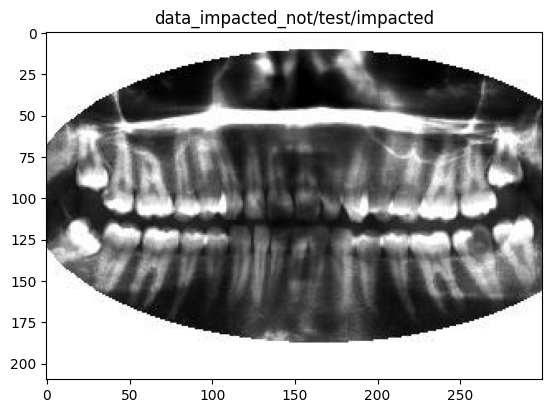

0846_jpg.rf.21922087f9d9ce3b24ba1f2f3557ce5e.jpg


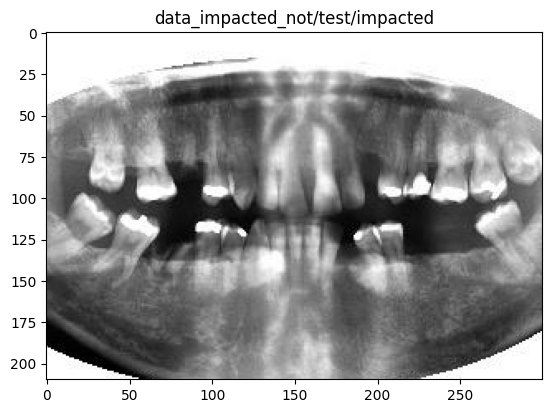

0331_jpg.rf.d01aba9b21d057dd19c47f3188df8f68.jpg


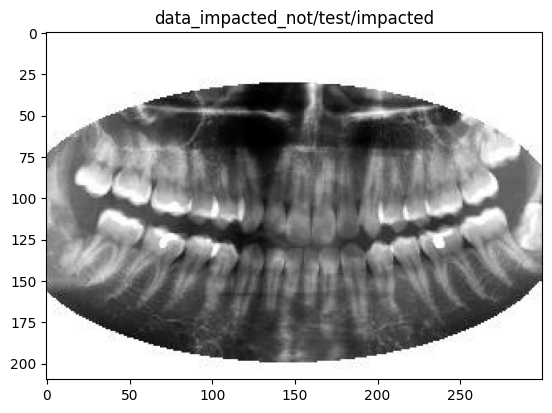

0936_jpg.rf.8243a9dd5334cd97eea92b8d4a59439e.jpg


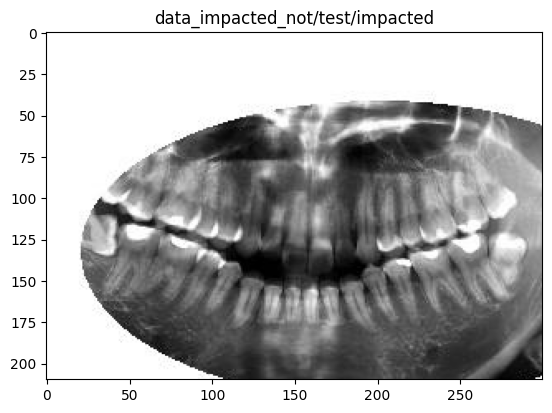

0060_jpg.rf.f094ea29e65bf0c78188acbcbc5c8dcd.jpg


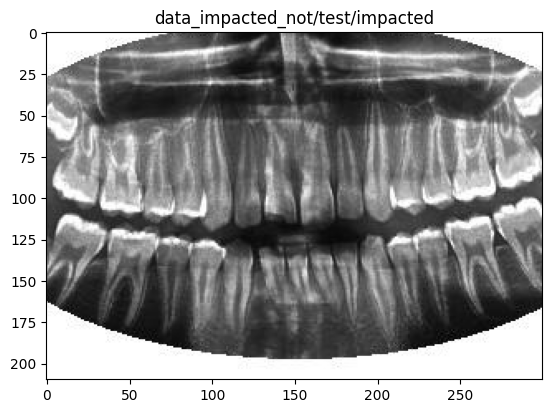

0538_jpg.rf.3aa73262a625104b61fa05c176d468fc.jpg


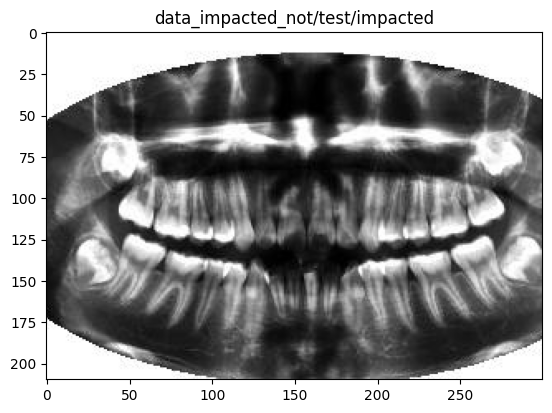

0215_jpg.rf.ae6fc0091ff7dab5bf8eab5a2ada7272.jpg


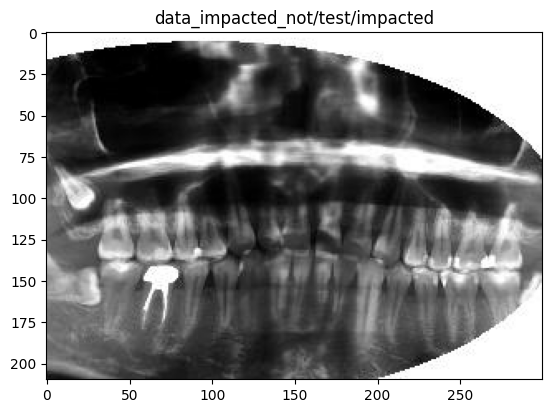

0906_jpg.rf.733b4ff98bf8afd4ea6aa34d17051fd4.jpg


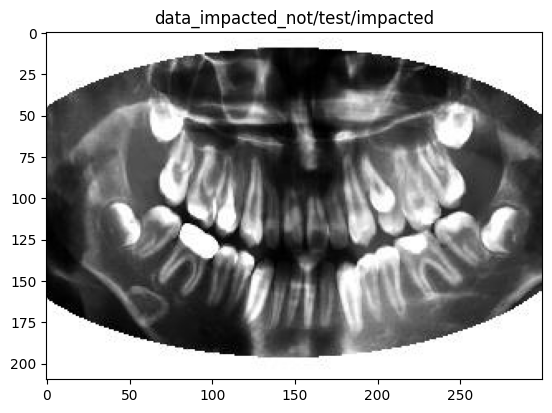

0139_jpg.rf.d4cd5163c13152c77c8982cf80a17a84.jpg


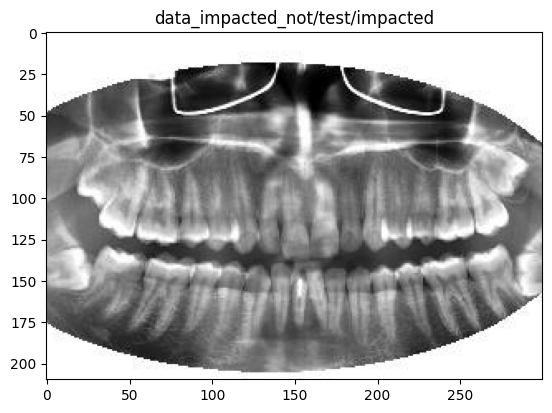

0273_jpg.rf.b74071d5766afa414178c51aeefc1e9d.jpg


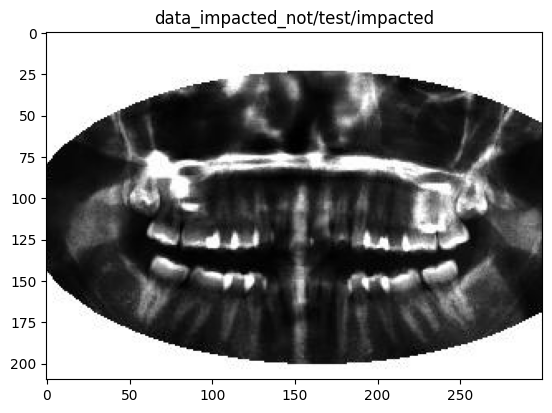

0161_jpg.rf.a54ad347955227c3eb7d1cfb1af9c51e.jpg


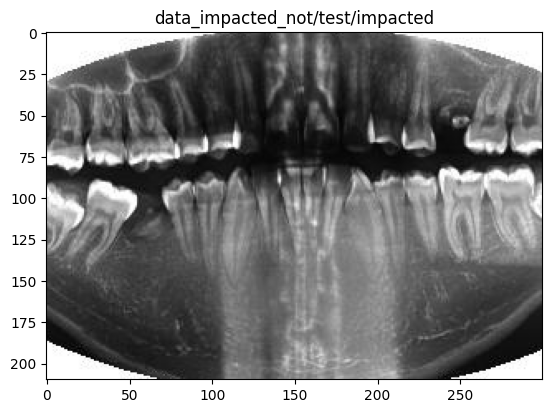

0038_jpg.rf.e13603a0be37e61c53a3b781040ce9f7.jpg


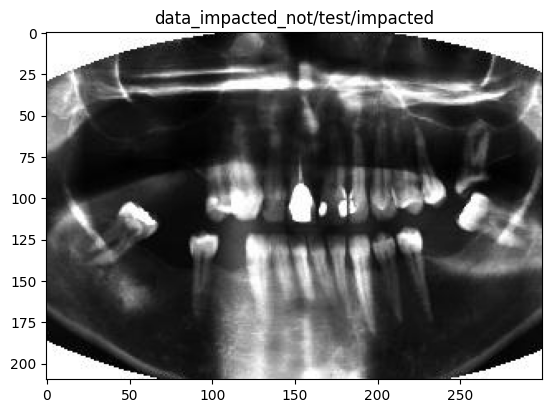

0368_jpg.rf.ae4c80bc75e51300b4de70922bf5e637.jpg


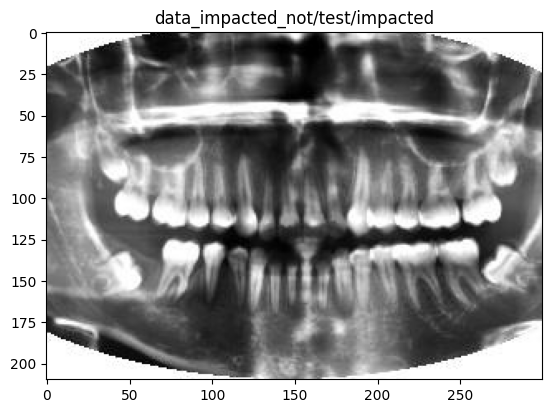

0239_jpg.rf.1e1cbd283aab8fb5c4b9822c5970d3ed.jpg


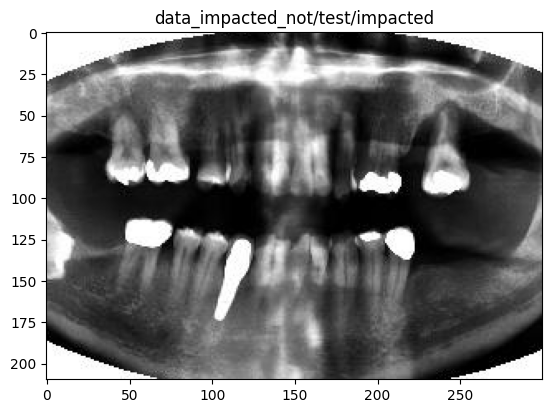

0529_jpg.rf.d3cb17dddc3e9efd85e48c386feca1f2.jpg


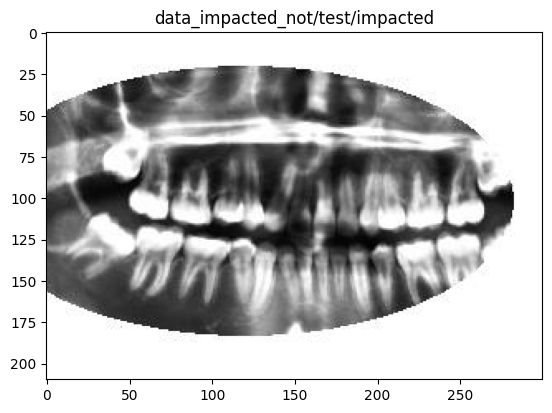

0009_jpg.rf.957a0a16c5101765b0679e95eb9619a3.jpg


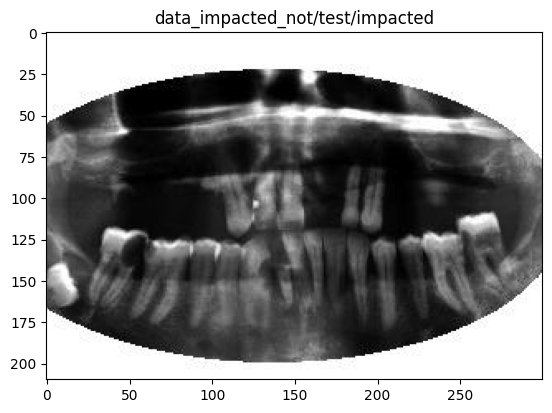

0213_jpg.rf.6304d5ebe5f8c87c3a8ed5495cc2bd58.jpg


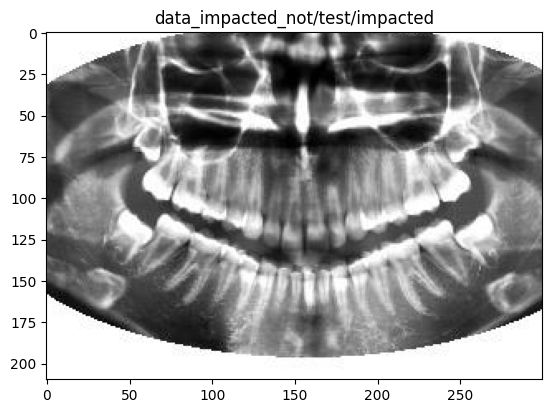

0370_jpg.rf.32e17da21801c80dd1f2a517e4e8c0e1.jpg


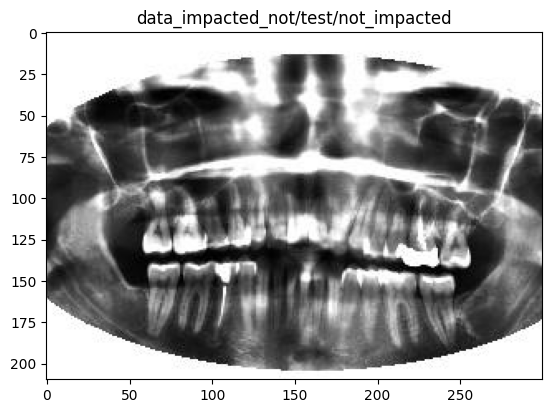

0724_jpg.rf.ad2c320086d82168e84b8576910ce244.jpg


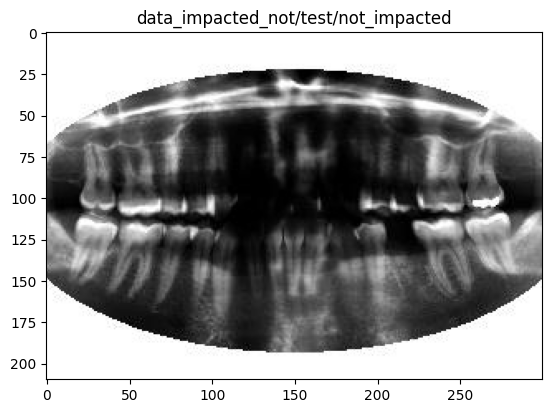

0976_jpg.rf.83d1e5e77aacc0d1c648682aa54ecd06.jpg


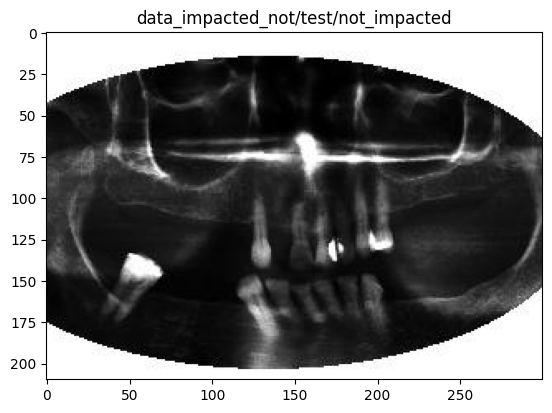

0564_jpg.rf.e086c7720a4a7be9d64b43c8588fd24a.jpg


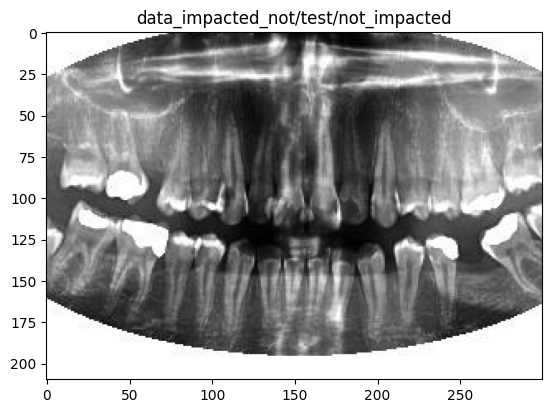

0298_jpg.rf.ecc80db88bce7954304f746c8536ad1f.jpg


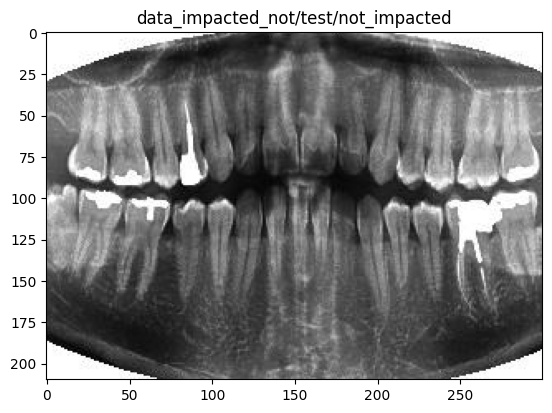

0151_jpg.rf.5b81ded715693313866503d5a4da1639.jpg


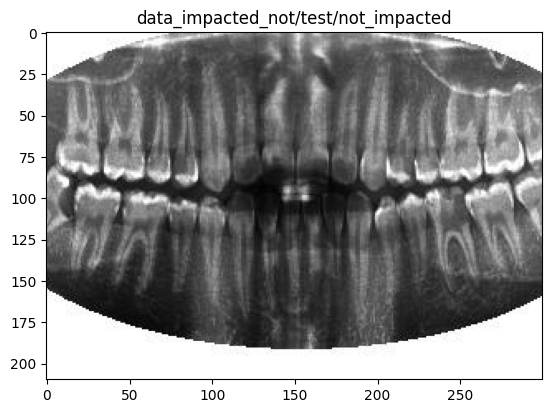

0136_jpg.rf.03e2aec8ec77594665dd1abc68d47bd3.jpg


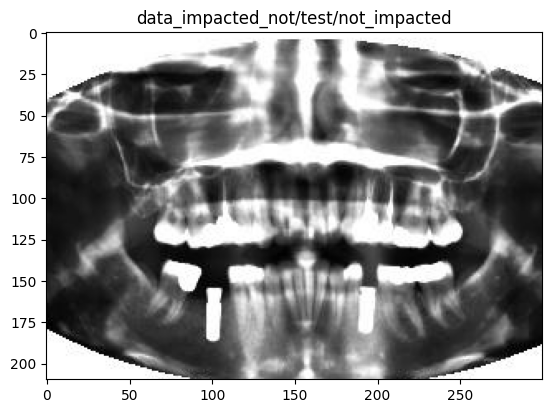

0669_jpg.rf.f1e2059357f8ba42a2c88434285180de.jpg


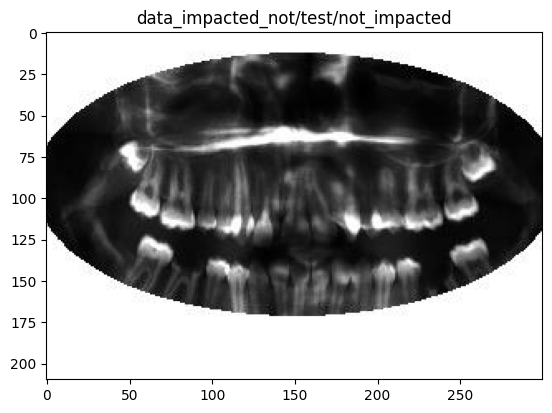

0095_jpg.rf.d7773e0afb13f54a3e6244079b483ab2.jpg


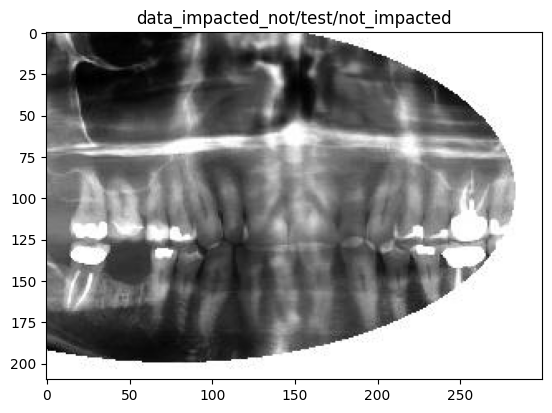

0007_jpg.rf.3699155bba57d7aecb1aa801a698ba20.jpg


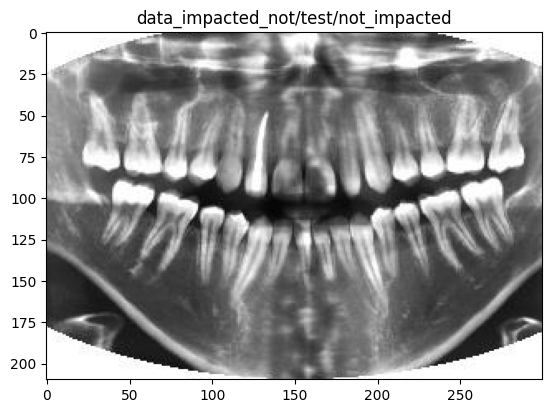

0890_jpg.rf.63a002852dc3ca1c77006ac5c4421e90.jpg


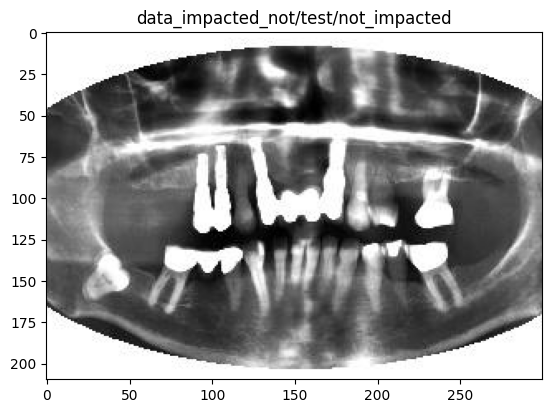

0688_jpg.rf.152fb99de9e0af07c5546e20e966b140.jpg


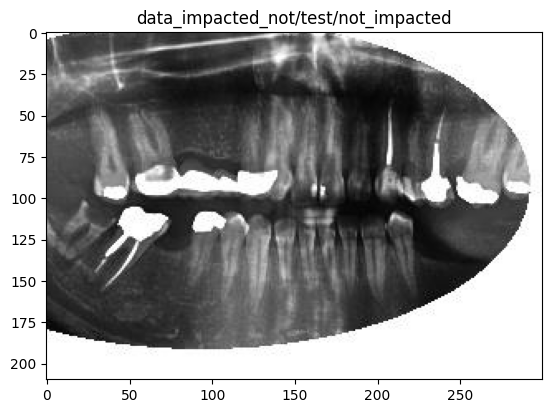

0180_jpg.rf.f74c66bb6212781fc6e6404fffe7ab9d.jpg


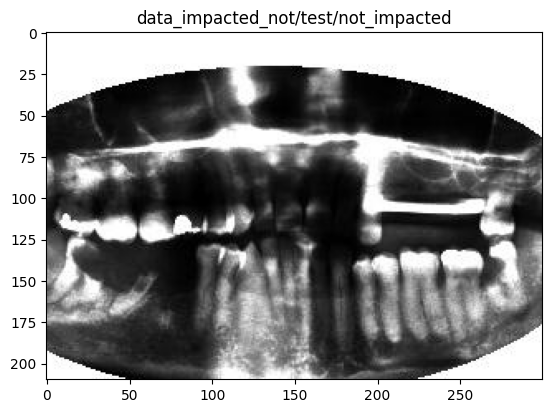

0814_jpg.rf.9da25d065869dffe1c6843dd2b8feb52.jpg


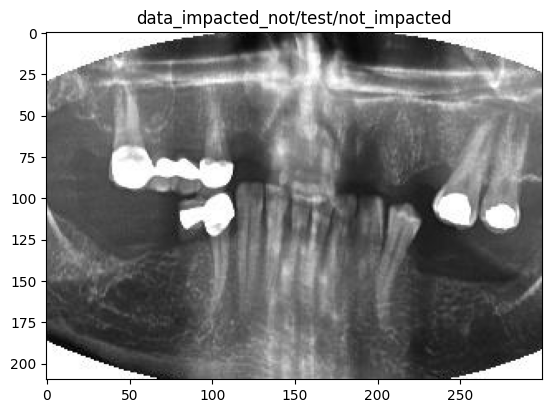

0074_jpg.rf.bc31f3d89ccb17453e7558a14bd6d5de.jpg


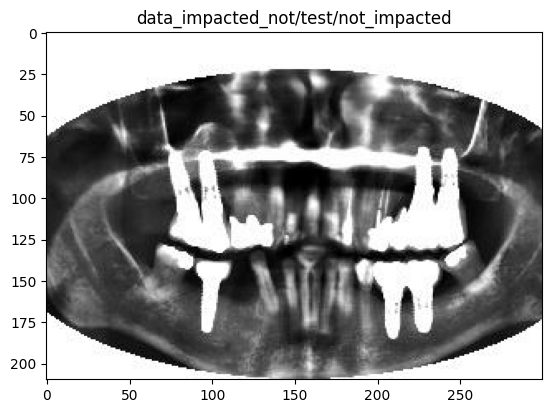

0140_jpg.rf.c65d9d0adf1e201a0bbca3c2f9cf2a08.jpg


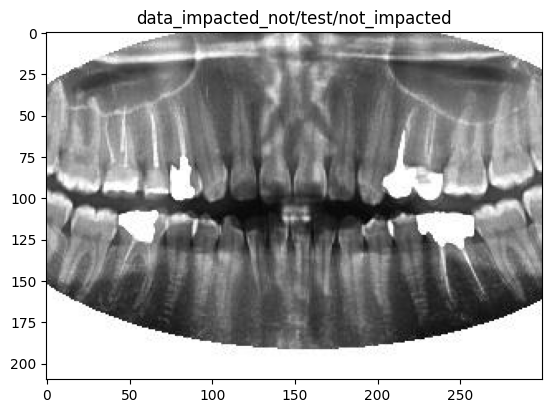

0668_jpg.rf.dccdcdd1ee027d2b11f9518e3d26d82f.jpg


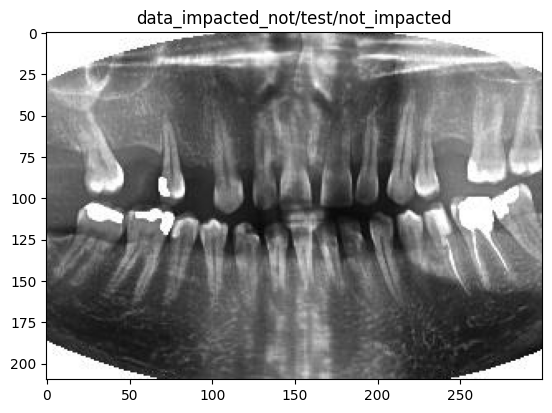

0507_jpg.rf.07ca548c6eb4f61c76f1629e7bc26fa4.jpg


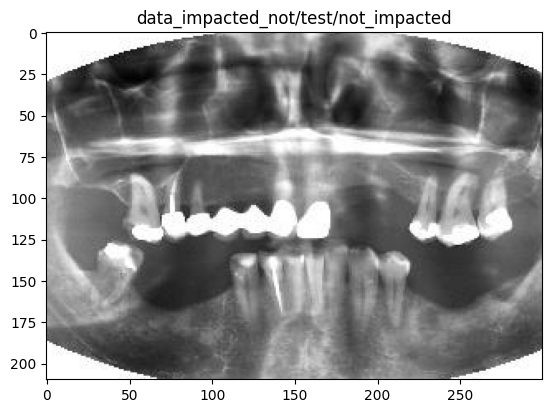

0004_jpg.rf.6434bfce7667ea786e5f251dc0d8b8b1.jpg


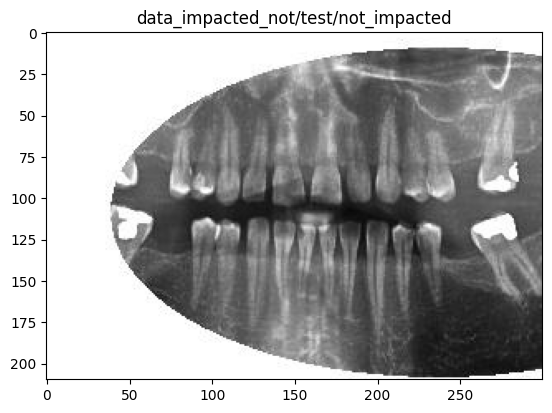

0206_jpg.rf.b982c8b0f8d6d230c1b685f125ab7140.jpg


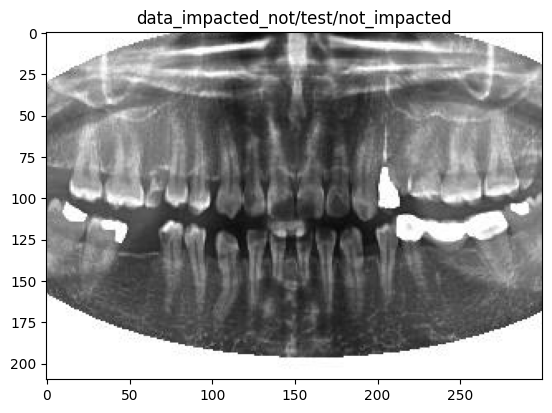

0747_jpg.rf.a11fa53901a855b4003f8dc5a71532c7.jpg


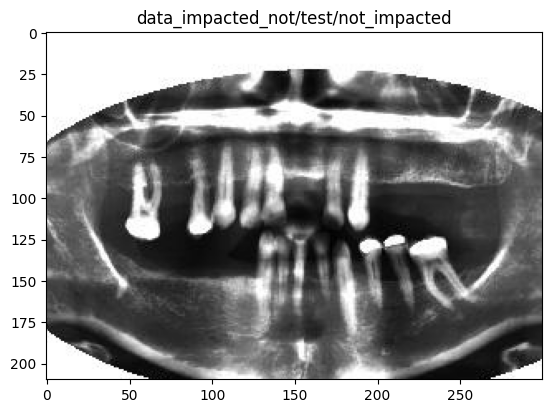

0898_jpg.rf.df4ec6f79f149df99ada80674fab2c0a.jpg


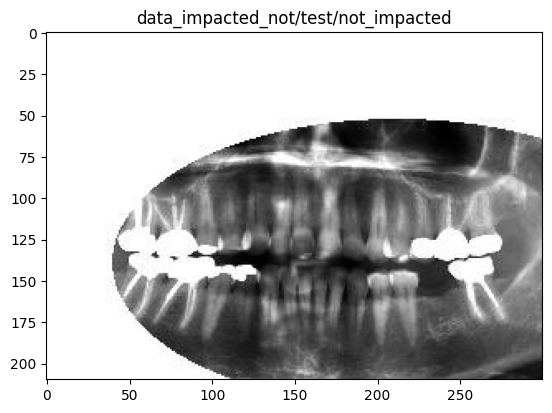

0128_jpg.rf.717cd6a69102c36ff5b84b4a87c5a210.jpg


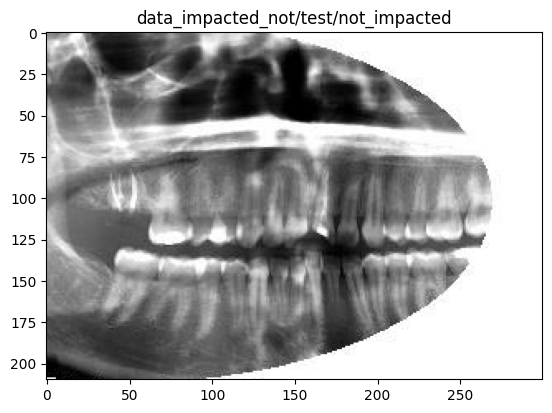

0905_jpg.rf.93c5b0e9d232f394f6cedf1c8f3879f4.jpg


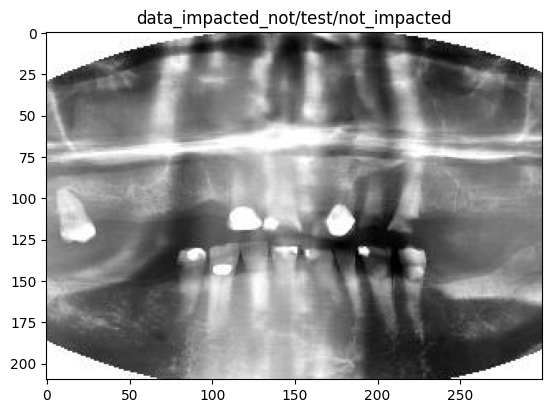

0480_jpg.rf.2c77b1e834ef71e71673f1ff1dcc0c2d.jpg


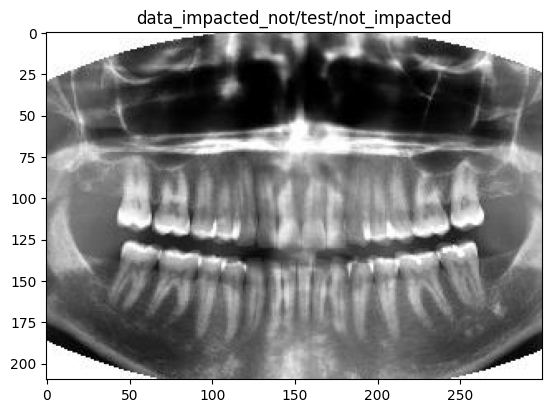

0610_jpg.rf.e2363fe0054fb51097cc2b6562011673.jpg


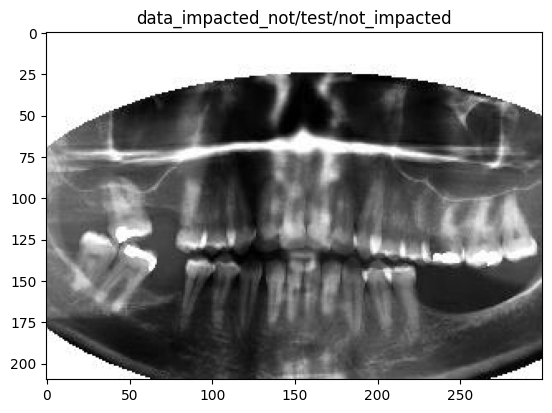

0999_jpg.rf.b3bbb1292154fe7bf750bdb9e56f7cd4.jpg


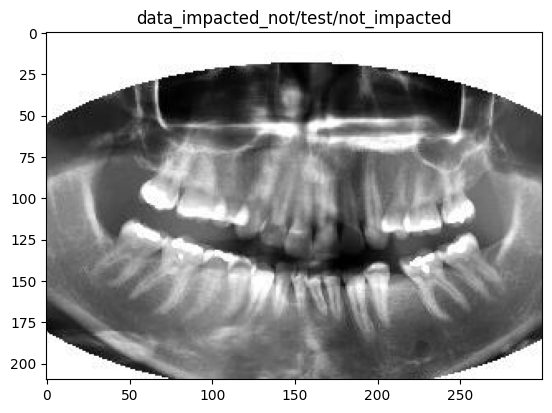

0323_jpg.rf.2bd124050fdcb8c212a28a98519b6f5c.jpg


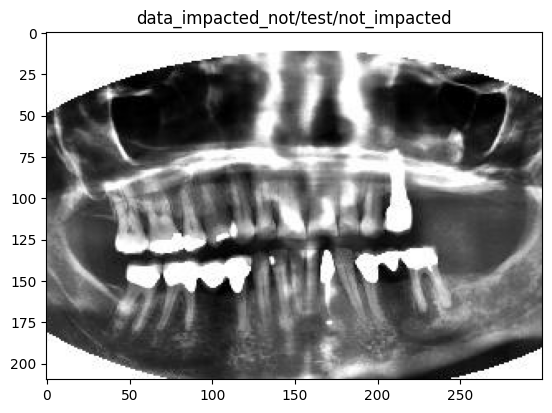

0061_jpg.rf.3188dc5179f4b6d600459b1aeba93e87.jpg


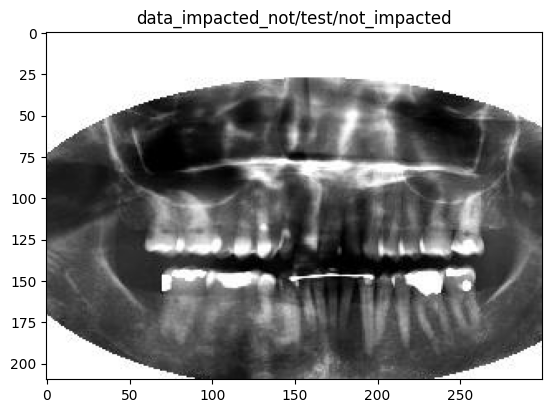

0794_jpg.rf.cc0c4ed7311e57db7eb6aa95d0dcbe47.jpg


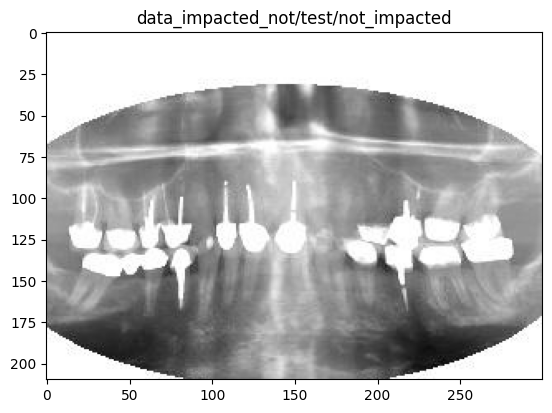

0156_jpg.rf.c3b593c25483534b0ad835ee21f62d59.jpg


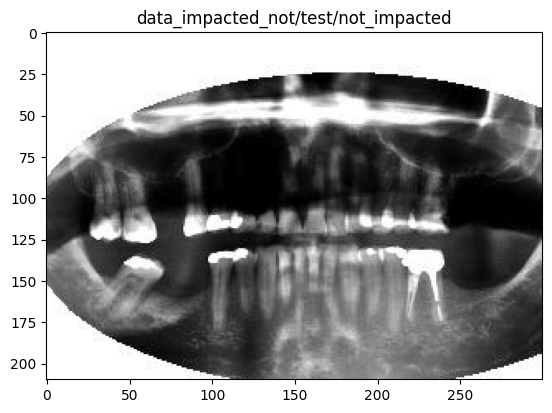

0168_jpg.rf.99cc9d1eae8cd16603df5ca3e11e4cf4.jpg


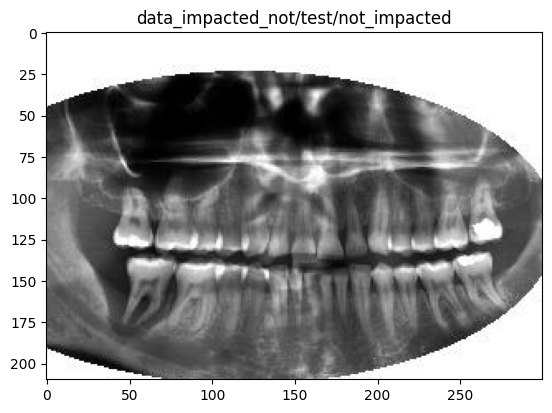

0129_jpg.rf.aa992cd69694d8acea8ae20613465d94.jpg


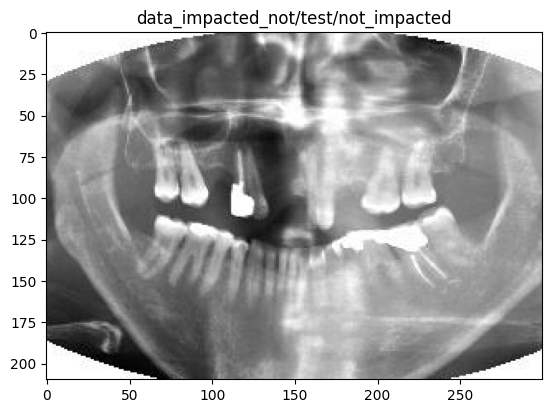

0246_jpg.rf.653968dbb7a7ed4af2e12a5cca61d0e8.jpg


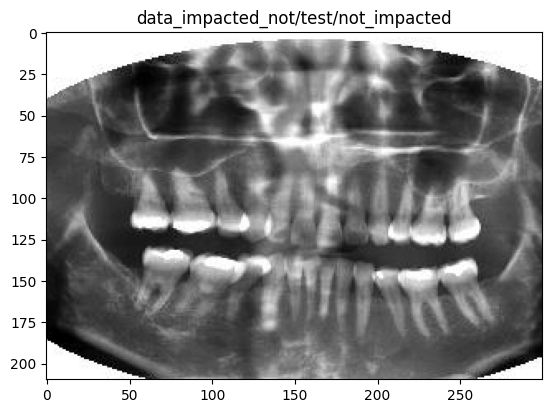

0515_jpg.rf.8ff9c1348b7bbea5171159da2f241b71.jpg


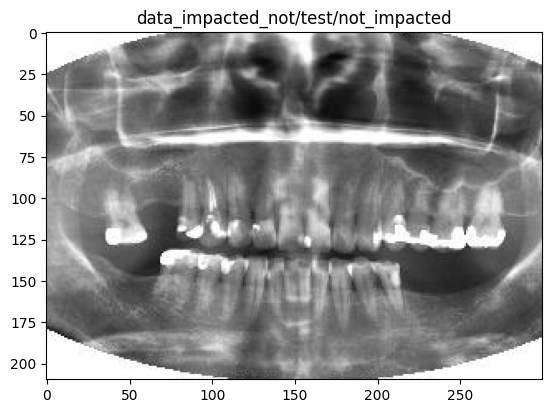

0445_jpg.rf.c1b87e7bf4165d062bf6dcfbb56f2c18.jpg


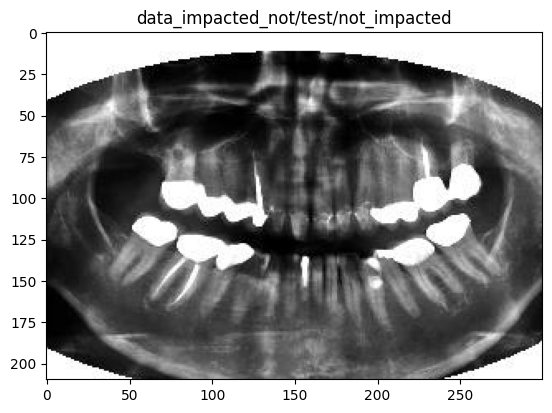

0750_jpg.rf.52761b15b0cc29d4193f20bca8abf978.jpg


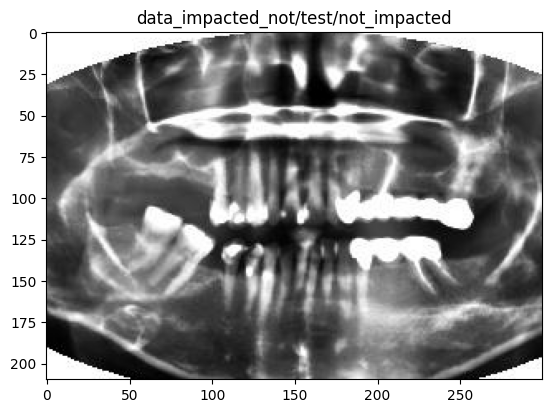

0407_jpg.rf.bbc905ad2322cd6b2a5f27c5e14571cd.jpg


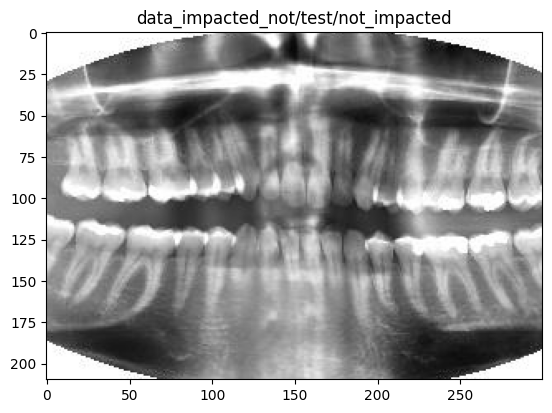

0762_jpg.rf.65fd543f0d87cc9d38dc1968abb4d2c7.jpg


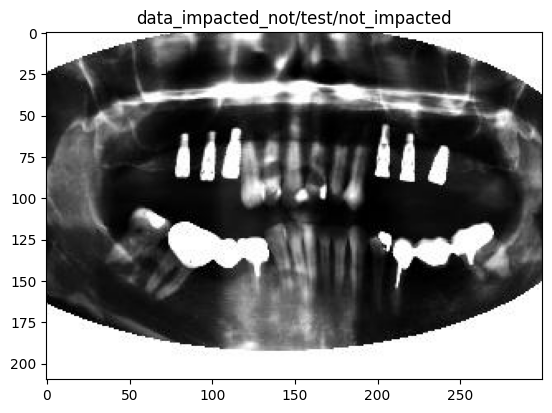

0186_jpg.rf.bce5a4ca22bfadf46df9667fdef8638d.jpg


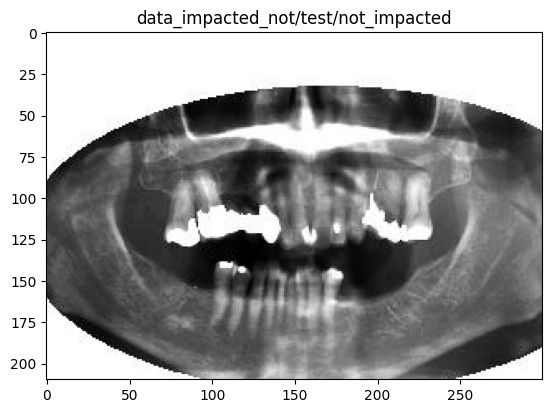

0545_jpg.rf.72449d9f3ad7aebeff3a4351bce2dd6e.jpg


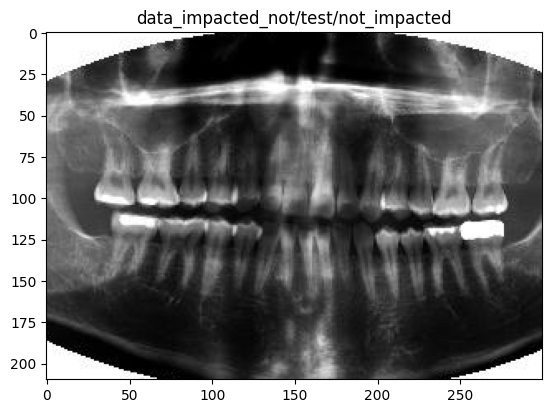

0305_jpg.rf.36d82670c3421c0004a468fe4047f470.jpg


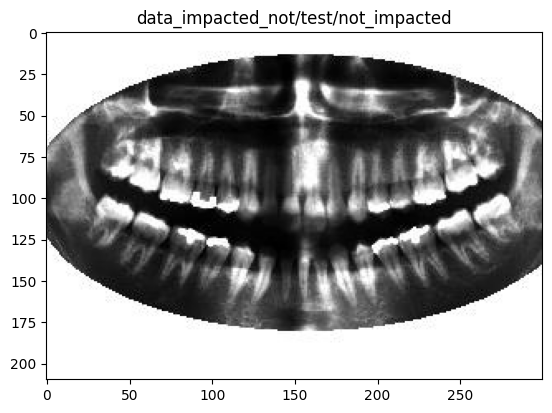

0623_jpg.rf.2dd72a2fd2469a4ce080214c3d30f318.jpg


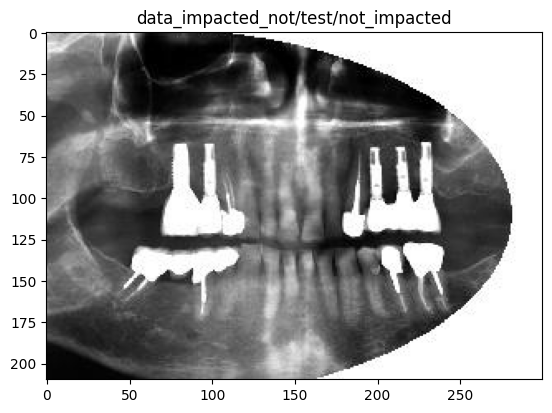

0339_jpg.rf.a01899bc5db14b320b43706ed57c67cb.jpg


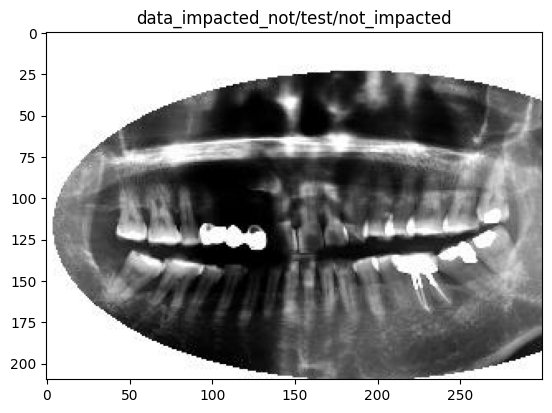

0967_jpg.rf.fde2e9d5ec9cb179161647bd31c61b23.jpg


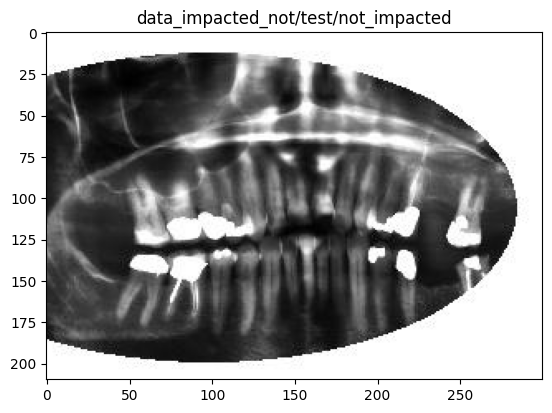

0403_jpg.rf.ba4274213b37ecd7b0bbd731d1eab084.jpg


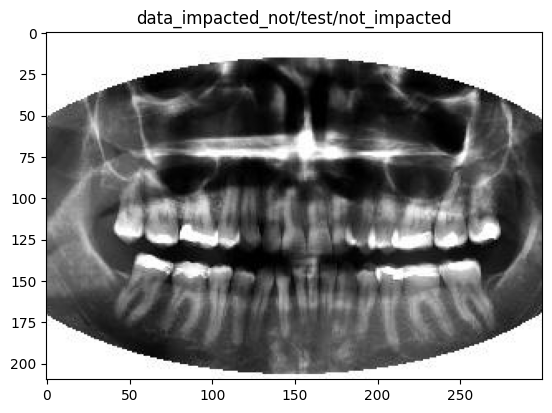

0929_jpg.rf.af9ae76db4cde136794162d06c9da6a3.jpg


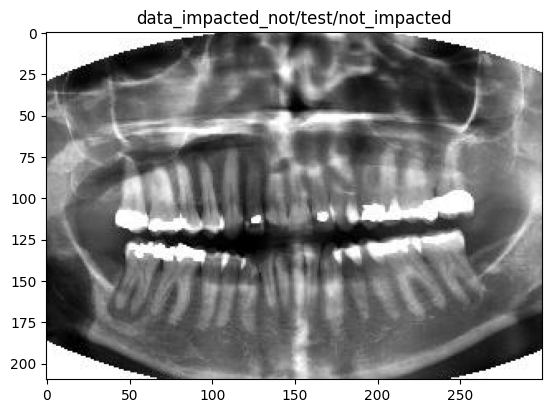

0485_jpg.rf.09576812fc790cab5da2f6a5ceafe25f.jpg


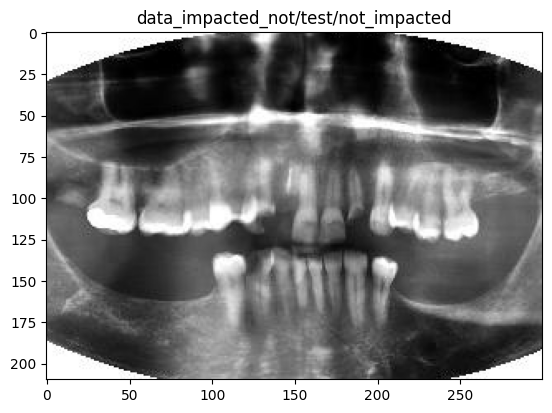

0277_jpg.rf.5ce1f22a0e596c40a1e0f0d901a42f73.jpg


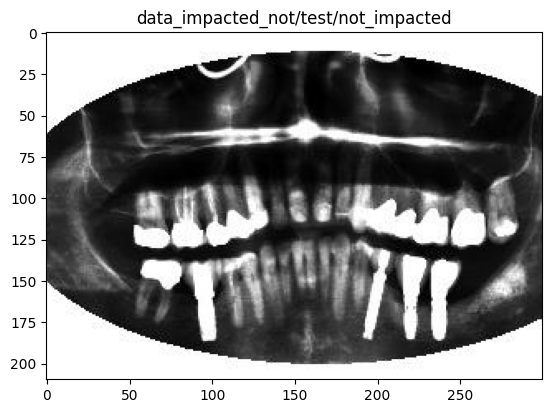

0641_jpg.rf.b40d29cb838c0bbe0bcf079f35ede7ce.jpg


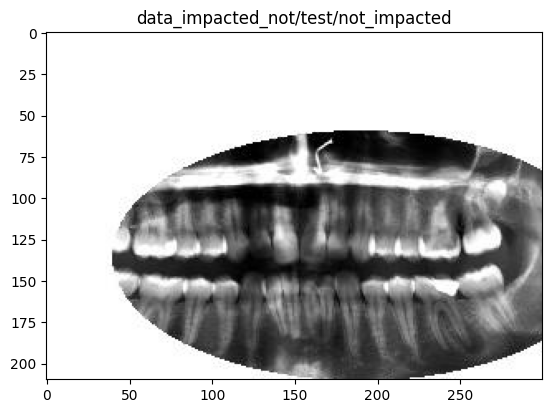

0554_jpg.rf.1269175f2171b29dd820f6bc9648f31e.jpg


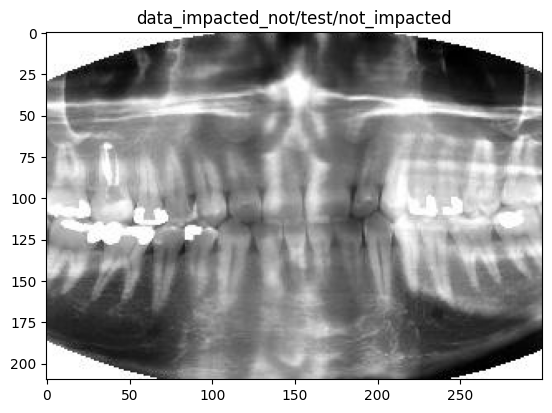

0428_jpg.rf.314f2ee0551f5c46c3b5fbb7b3b4026e.jpg


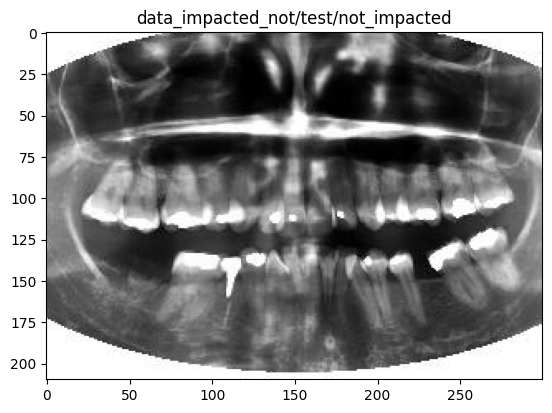

0053_jpg.rf.0a39e4969cb730a0e08d415d819e14d9.jpg


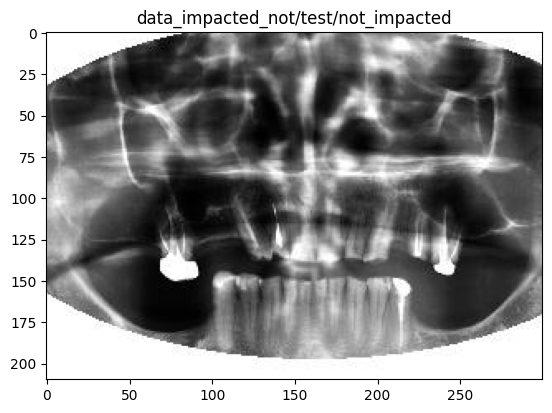

0210_jpg.rf.96b70d0bcab51f3af08bb857b4231fa8.jpg


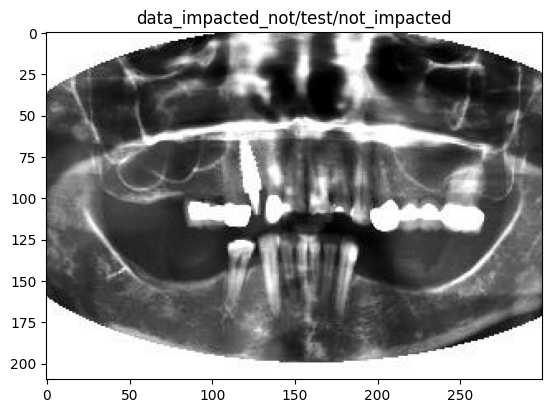

0081_jpg.rf.b8e53bd80056c633065450a6800872b2.jpg


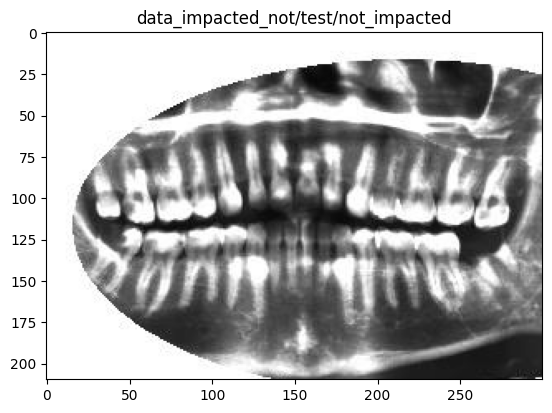

0649_jpg.rf.b7d1c07a5deeb45e8fa8a2a076f504fd.jpg


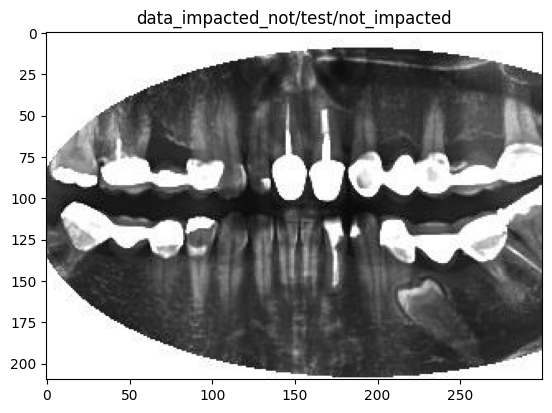

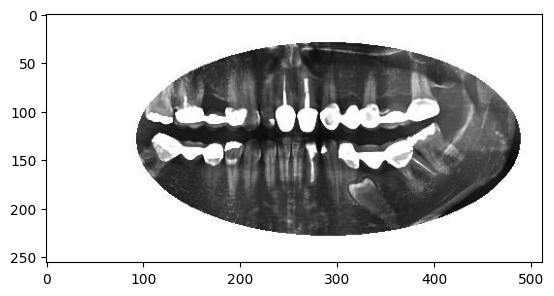

In [65]:
def display_part_picture_from_path(file_path, x1, x2, y1, y2):
    """
    Parameters
    ----------
    path : file location
        row from the dataframe
    data_folder : str, optional
        folder where the data is located

    data_subfolder : str, optional
        subfolder where the data is located

    Returns
    -------
    displays the part of the image that is in the row
    """
    img = plt.imread(file_path)
    plt.imshow(img[y1:y2, x1:x2])
    plt.title(os.path.dirname(file_path))
    plt.show()

    plt.imshow(img)

for train_test_valid in ["test"]:

    for folder_class in ["impacted", "not_impacted"]:
        folder_path = f"data_impacted_not/{train_test_valid}/{folder_class}"
        for file_path in os.listdir(folder_path):
            print(file_path)
            display_part_picture_from_path(file_path=os.path.join(folder_path, file_path),
                                           x1=100,
                                           x2=400,
                                           y1=20,
                                           y2=230)
